In [ ]:
# Librerias
import pandas as pd
import random
import shap
import seaborn as sns
import numpy as np
from pyexpat import model
import optuna
import warnings
import matplotlib.pyplot as plt
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split, GridSearchCV, RandomizedSearchCV, cross_val_score, StratifiedKFold
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import accuracy_score, precision_score, make_scorer, recall_score, f1_score, roc_auc_score, confusion_matrix, classification_report, balanced_accuracy_score, ConfusionMatrixDisplay, roc_curve, auc
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from sklearn.impute import SimpleImputer, KNNImputer
from imblearn.over_sampling import RandomOverSampler
from imblearn.under_sampling import RandomUnderSampler
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import IterativeImputer
from pycaret.classification import *
from sklearn.datasets import make_classification, load_breast_cancer
from sklearn.preprocessing import label_binarize
from sklearn.multiclass import OneVsRestClassifier
from sklearn.metrics import accuracy_score
from keras.models import Sequential
from keras.layers import Dense
from sklearn.metrics import classification_report
from skopt import gp_minimize
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import cross_val_score


Explicacion de cada Variable

Date: es la fecha en la que se registraron todos las variables climaticas.

Location: son las ciudades de Australia en dode se registraron las variables climaticas.

MinTemp: la temperatura minima del dia registrado en Date.

MaxTemp: la temperatura maxima del dia registrado en Date.

Rainfall: cantidad de milimetros de agua caida.

Evaporation: evaporacion del agua.



In [2]:
# Importamos el csv
weather = pd.read_csv('./weatherAUS.csv')

In [3]:
# Mostramos las columnas del dataset
weather.columns

Index(['Date', 'Location', 'MinTemp', 'MaxTemp', 'Rainfall', 'Evaporation',
       'Sunshine', 'WindGustDir', 'WindGustSpeed', 'WindDir9am', 'WindDir3pm',
       'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am', 'Humidity3pm',
       'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm', 'Temp9am',
       'Temp3pm', 'RainToday', 'RainTomorrow'],
      dtype='object')

1.  Date: Fecha de la observación, en formato AAAA-MM-DD.

2.	Location: Nombre de la localidad donde se registraron los datos meteorológicos.

3.	MinTemp: Temperatura mínima registrada durante el día (en grados Celsius).

4.	MaxTemp: Temperatura máxima registrada durante el día (en grados Celsius).

5.	Rainfall: Cantidad total de lluvia registrada durante el día (en milímetros).

6.	Evaporation: Cantidad de agua evaporada durante el día (en milímetros).

7.	Sunshine: Cantidad de horas de sol registradas durante el día.

8.	WindGustDir: Dirección del viento durante la ráfaga más fuerte del día, expresada en abreviaturas de puntos cardinales (por ejemplo, W para oeste).

9.	WindGustSpeed: Velocidad máxima del viento durante una ráfaga en el día, medida en km/h.

10.	WindDir9am: Dirección del viento a las 9:00 am, en abreviaturas de puntos cardinales.

11.	WindDir3pm: Dirección del viento a las 3:00 pm, en abreviaturas de puntos cardinales.

12.	WindSpeed9am: Velocidad del viento a las 9:00 am, medida en km/h.

13.	WindSpeed3pm: Velocidad del viento a las 3:00 pm, medida en km/h.

14.	Humidity9am: Humedad relativa registrada a las 9:00 am (en porcentaje).

15.	Humidity3pm: Humedad relativa registrada a las 3:00 pm (en porcentaje).

16.	Pressure9am: Presión atmosférica registrada a las 9:00 am (en hPa - hectopascales).

17.	Pressure3pm: Presión atmosférica registrada a las 3:00 pm (en hPa - hectopascales).

18.	Cloud9am: Cantidad de nubes observada a las 9:00 am (en octavos del cielo cubierto).

19.	Cloud3pm: Cantidad de nubes observada a las 3:00 pm (en octavos del cielo cubierto).

20.	Temp9am: Temperatura registrada a las 9:00 am (en grados Celsius).

21.	Temp3pm: Temperatura registrada a las 3:00 pm (en grados Celsius).

22.	RainToday: Indica si llovió o no durante el día anterior (valores: Yes o No).

23.	RainTomorrow: Indica si llovió o no el día siguiente al de la observación (valores: Yes o No). Esta variable se utiliza frecuentemente como objetivo en modelos predictivos.


# Ejercicio 1

La cantidad de datos que faltan en las columnas es:
Date                 0
Location             0
MinTemp           1485
MaxTemp           1261
Rainfall          3261
Evaporation      62790
Sunshine         69835
WindGustDir      10326
WindGustSpeed    10263
WindDir9am       10566
WindDir3pm        4228
WindSpeed9am      1767
WindSpeed3pm      3062
Humidity9am       2654
Humidity3pm       4507
Pressure9am      15065
Pressure3pm      15028
Cloud9am         55888
Cloud3pm         59358
Temp9am           1767
Temp3pm           3609
RainToday         3261
RainTomorrow      3267
dtype: int64


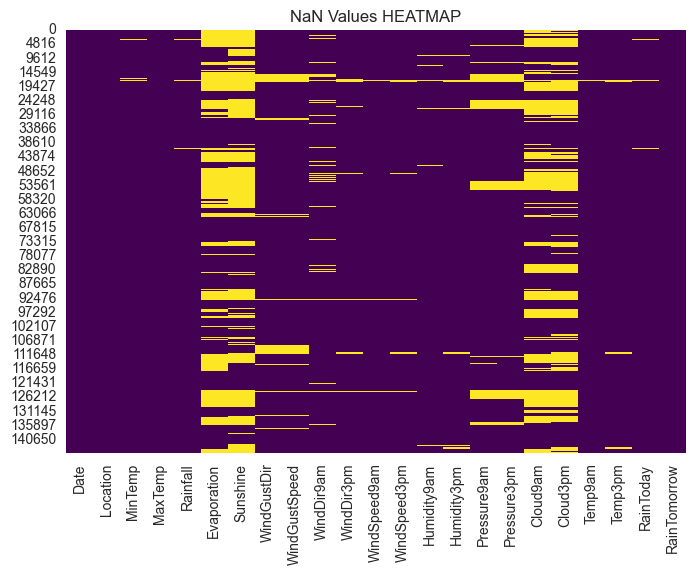

In [4]:
# Obtenemos con True o False las columnas con valores nulos y luego las sumamos para saber la cantidad de valores faltantes por cada columna.
weather_null = weather.isnull().sum()
print('La cantidad de datos que faltan en las columnas es:')
print(weather_null)


# Eliminamos las filas donde la columna 'RainTomorrow' tenga valores NaN, ya que estos registros no nos sirven para el entrenamiento del modelo.
# Esto se debe a que el valor a predecir no existe en esos casos.
weather_depurado = weather.dropna(subset=['RainTomorrow'])

# Mostramos la cantidad de datos faltantes con un Heatmap, donde cada línea amarilla indica que hay un NaN en ese índice de registro.
sns.heatmap(weather_depurado.isnull(), cbar=False, cmap='viridis')
plt.title('NaN Values HEATMAP')
plt.show()

# Conclusión: observamos que hay una cantidad alta de datos faltantes en la mayoría de las columnas.

Para elegir las ciudades, obtener los valores únicos de la columna Location del DataFrame y ejecutar una línea de código donde se elijan de manera aleatoria 10 ciudades de esos valores. Quedarse con estas ciudades para todo el trabajo práctico.


Conclusión: observamos que tenemos una cantidad alta de datos faltantes en varias columnas, menos en la fecha de registro del dato y la localidad donde se registró. Observamos que tenemos varias columnas que son categóricas, por lo tanto primero las transformamos a numéricas y luego completamos los faltantes

In [5]:
# Contamos la cantidad de días en los que llovió y los comparamos con los días en los que no llovió.
si_no = weather_depurado['RainTomorrow'].value_counts()
print(f'La cantidad de dias que llovio vs los dias que no de la columna RainTomorrow es :{si_no}')

La cantidad de dias que llovio vs los dias que no de la columna RainTomorrow es :RainTomorrow
No     110316
Yes     31877
Name: count, dtype: int64


Conclusión: Podemos ver que el Dataset de weatherAUS.csv, una vez ya filtrados todos los valores nan de la columna 'RainTomorrow', vemos que tenemos un gran desbalance entre los días que no llueven vs los dias que si llueven por lo que cuando entrenemos el modelo con estas cantidades vamos a ver afectado el modelo ya que va a tener muchos más valores FN y FP ya que está desbalanceado y va a tender a predecir más días que no llovía que dias que si.

Tenemos que realizar un submuestreo o un sobremuestreo, para balancear todo el dataset y no tener esa tendencia a que no llovió.


In [6]:
# Mostramos todas las ciudades que están en nuestro dataset. En total, son 49 ciudades de las que tenemos registros.
weather_depurado['Location'].unique()

array(['Albury', 'BadgerysCreek', 'Cobar', 'CoffsHarbour', 'Moree',
       'Newcastle', 'NorahHead', 'NorfolkIsland', 'Penrith', 'Richmond',
       'Sydney', 'SydneyAirport', 'WaggaWagga', 'Williamtown',
       'Wollongong', 'Canberra', 'Tuggeranong', 'MountGinini', 'Ballarat',
       'Bendigo', 'Sale', 'MelbourneAirport', 'Melbourne', 'Mildura',
       'Nhil', 'Portland', 'Watsonia', 'Dartmoor', 'Brisbane', 'Cairns',
       'GoldCoast', 'Townsville', 'Adelaide', 'MountGambier', 'Nuriootpa',
       'Woomera', 'Albany', 'Witchcliffe', 'PearceRAAF', 'PerthAirport',
       'Perth', 'SalmonGums', 'Walpole', 'Hobart', 'Launceston',
       'AliceSprings', 'Darwin', 'Katherine', 'Uluru'], dtype=object)

In [7]:
# Elejimos 10 ciudades aleatoriamente de 'Location' de las 49 registradas.
cities = weather_depurado['Location'].unique()

# Seleccionamos 10 números al azar para elegir las ciudades.
# num = random.sample(range(0, 49), 10)
num = [4,8,45,23,5,17,33,48,28,11]

# Tomamos el primer número para seleccionar una ciudad y, con ella, guardamos en la variable 'weather_ten_cities' todos los registros de la primera ciudad.
weather_ten_cities = (weather_depurado[weather_depurado['Location'] == cities[num[0]]])

# Iteramos sobre los números seleccionados para elegir las ciudades y, con ellos, seleccionamos las ciudades restantes, 
# guardando todos los registros de las 9 ciudades faltantes.
for number in range(1,10):
  weather_ten_cities = pd.concat([weather_ten_cities, weather_depurado[weather_depurado['Location'] == cities[num[number]]]], ignore_index=True)

# Dataset con registros de solo 10 ciudades de las 49.
weather_ten_cities

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,2009-01-01,Moree,16.4,38.7,0.0,12.2,9.3,NW,54.0,N,...,27.0,11.0,1005.5,1003.3,6.0,8.0,28.9,37.4,No,No
1,2009-01-02,Moree,22.3,30.3,0.0,11.2,3.0,NNE,30.0,NNE,...,68.0,40.0,1009.5,1009.0,6.0,7.0,25.2,29.4,No,No
2,2009-01-03,Moree,21.2,33.3,0.0,6.2,11.7,ENE,46.0,ENE,...,57.0,31.0,1014.9,1012.2,6.0,5.0,24.5,32.7,No,No
3,2009-01-04,Moree,16.4,33.5,0.0,11.2,13.3,ENE,39.0,NE,...,51.0,28.0,1016.9,1012.2,1.0,3.0,22.9,31.9,No,No
4,2009-01-05,Moree,19.2,34.5,0.0,12.6,13.4,SE,35.0,ENE,...,44.0,22.0,1015.1,1010.6,1.0,6.0,24.2,32.9,No,No
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
28430,2017-06-21,SydneyAirport,8.6,18.6,0.2,2.0,7.8,SSW,56.0,NNW,...,69.0,67.0,1025.7,1025.3,2.0,2.0,13.3,17.7,No,No
28431,2017-06-22,SydneyAirport,9.5,17.8,0.2,2.0,9.2,SW,35.0,NNW,...,74.0,70.0,1028.3,1024.6,2.0,2.0,14.3,16.8,No,No
28432,2017-06-23,SydneyAirport,8.7,19.4,0.0,2.4,2.7,NNW,30.0,NW,...,83.0,57.0,1020.8,1014.7,6.0,6.0,10.9,18.2,No,No
28433,2017-06-24,SydneyAirport,9.4,19.9,0.0,1.4,9.3,SW,43.0,WNW,...,61.0,41.0,1017.3,1015.2,5.0,2.0,12.9,19.3,No,No


In [8]:
# Observamos una reducción en la cantidad de datos y una disminución del desbalance.
# Aunque todavía existe una gran brecha en algunas variables.
weather_ten_cities.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 28435 entries, 0 to 28434
Data columns (total 23 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Date           28435 non-null  object 
 1   Location       28435 non-null  object 
 2   MinTemp        28068 non-null  float64
 3   MaxTemp        28255 non-null  float64
 4   Rainfall       28134 non-null  float64
 5   Evaporation    16677 non-null  float64
 6   Sunshine       16147 non-null  float64
 7   WindGustDir    25018 non-null  object 
 8   WindGustSpeed  25020 non-null  float64
 9   WindDir9am     25712 non-null  object 
 10  WindDir3pm     26817 non-null  object 
 11  WindSpeed9am   27968 non-null  float64
 12  WindSpeed3pm   27310 non-null  float64
 13  Humidity9am    27773 non-null  float64
 14  Humidity3pm    27224 non-null  float64
 15  Pressure9am    19592 non-null  float64
 16  Pressure3pm    19592 non-null  float64
 17  Cloud9am       20190 non-null  float64
 18  Cloud3

In [9]:
weather_ten_cities.describe()

,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm
count,28068.000000,28255.000000,28134.000000,16677.000000,16147.000000,25020.000000,27968.000000,27310.000000,27773.000000,27224.000000,19592.000000,19592.000000,20190.000000,19611.000000,27871.000000,27313.000000
mean,12.033002,23.881989,2.160795,6.071596,8.072298,39.198161,13.347647,16.737129,64.648760,46.605054,1017.978971,1015.106615,3.967707,4.170873,17.260105,22.483089
std,6.731874,8.076114,7.965198,4.514066,3.769261,13.898143,9.063541,9.072639,22.088035,23.254885,6.692801,6.701819,2.947146,2.728122,7.063821,7.959823
min,-8.500000,-4.800000,0.000000,0.000000,0.000000,7.000000,0.000000,0.000000,1.000000,1.000000,985.100000,984.900000,0.000000,0.000000,-7.200000,-5.400000
25%,7.200000,18.600000,0.000000,3.000000,5.600000,30.000000,6.000000,9.000000,51.000000,28.000000,1013.400000,1010.500000,1.000000,1.000000,12.400000,17.400000
50%,12.000000,23.600000,0.000000,5.200000,9.200000,37.000000,13.000000,15.000000,66.000000,46.000000,1018.100000,1015.200000,4.000000,4.000000,17.200000,22.200000
75%,17.500000,29.300000,0.400000,8.000000,10.900000,48.000000,19.000000,22.000000,82.000000,62.000000,1022.600000,1019.700000,7.000000,7.000000,22.400000,27.800000
max,31.900000,47.300000,240.000000,65.400000,14.500000,120.000000,130.000000,83.000000,100.000000,100.000000,1038.800000,1037.000000,8.000000,8.000000,39.100000,46.700000


In [10]:
# Creamos las variables dummy para las columnas 'Location', 'RainToday' y 'RainTomorrow', realizando así una codificación binaria (1 y 0).
# Para 'RainToday' y 'RainTomorrow', un valor de 1 indica 'Yes' y un valor de 0 indica 'No'.
# Para la columna 'Location', creamos 10 columnas (una para cada ciudad seleccionada),
# con un valor de 1 si el registro corresponde a esa ciudad y 0 si no corresponde.
weather_ten_cities = pd.get_dummies(weather_ten_cities, columns=['Location'],drop_first=True)
weather_ten_cities = pd.get_dummies(weather_ten_cities, columns=['RainToday'],drop_first=True)
weather_ten_cities['RainTomorrow'] = weather_ten_cities['RainTomorrow'].replace('Yes',1)
weather_ten_cities['RainTomorrow'] = weather_ten_cities['RainTomorrow'].replace('No',0)

In [11]:
# En las columnas 'WindGustDir', 'WindDir9am' y 'WindDir3pm' tenemos los puntos cardinales, que son 16 en total.
# Estos 16 puntos cardinales los transformamos en sus respectivos grados, para luego aplicar una transformación
# llamada seno-coseno, la cual es muy útil para variables cíclicas como estas. Por cada variable, creamos 2 columnas:
# una para el seno y otra para el coseno.
cardinal_to_angle = {
    'N': 0,
    'NNE': 22.5,
    'NE': 45,
    'ENE': 67.5,
    'E': 90,
    'ESE': 112.5,
    'SE': 135,
    'SSE': 157.5,
    'S': 180,
    'SSW': 202.5,
    'SW': 225,
    'WSW': 247.5,
    'W': 270,
    'WNW': 292.5,
    'NW': 315,
    'NNW': 337.5,
}

# Reemplazamos los puntos cardinales por sus respectivos ángulos.
weather_ten_cities['WindGustDir'] = weather_ten_cities['WindGustDir'].replace(cardinal_to_angle)
weather_ten_cities['WindDir9am'] = weather_ten_cities['WindDir9am'].replace(cardinal_to_angle)
weather_ten_cities['WindDir3pm'] = weather_ten_cities['WindDir3pm'].replace(cardinal_to_angle)

# Calculamos las coordenadas seno y coseno para la variable 'WindGustDir'.
weather_ten_cities['WindGustDir_Sen'] = np.sin(weather_ten_cities['WindGustDir'])
weather_ten_cities['WindGustDir_Cos'] = np.cos(weather_ten_cities['WindGustDir'])

# Calculamos las coordenadas seno y coseno para la variable 'WindDir9am'.
weather_ten_cities['WindDir9am_Sen'] = np.sin(weather_ten_cities['WindDir9am'])
weather_ten_cities['WindDir9am_Cos'] = np.cos(weather_ten_cities['WindDir9am'])

# Calculamos las coordenadas seno y coseno para la variable 'WindDir3pm'.
weather_ten_cities['WindDir3pm_Sen'] = np.sin(weather_ten_cities['WindDir3pm'])
weather_ten_cities['WindDir3pm_Cos'] = np.cos(weather_ten_cities['WindDir3pm'])

# Eliminamos las variables originales 'WindGustDir', 'WindDir9am' y 'WindDir3pm', ya que no serán necesarias para el entrenamiento del modelo.
weather_ten_cities = weather_ten_cities.drop(columns=['WindGustDir'])
weather_ten_cities = weather_ten_cities.drop(columns=['WindDir9am'])
weather_ten_cities = weather_ten_cities.drop(columns=['WindDir3pm'])

Conclusión: esta manera de transformar a estas variables nos sirven para expresar a la variable como un vector de módulo uno, con dos componentes; para que cuando entrenemos el modelo tengan el mismo peso cada variable.

In [12]:
# Cambiamos el formato de la variable 'Date' a datetime en nuestro dataset, para posteriormente poder extraer el mes y el año.
weather_ten_cities['Date'] = pd.to_datetime(weather_ten_cities['Date'], format='%Y-%m-%d')

# Extraemos el mes y el año de la variable 'Date'.
weather_ten_cities['Mes'] = weather_ten_cities['Date'].dt.month
weather_ten_cities['Año'] = weather_ten_cities['Date'].dt.year

# Eliminamos la variable 'Date', ya que no será útil para el entrenamiento de nuestro modelo.
weather_ten_cities = weather_ten_cities.drop(columns=['Date'])

Conclusión: No utilizamos el día para entrenar el modelo, ya que no es significativa esa variable,porque nos podría provocar un sobreajuste cuando el modelo quiera predecir y no nos ayudaría en una generalización.

In [13]:
# Mostramos el total de columnas disponibles en el dataset para el entrenamiento del modelo.
weather_ten_cities.columns

Index(['MinTemp', 'MaxTemp', 'Rainfall', 'Evaporation', 'Sunshine',
       'WindGustSpeed', 'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am',
       'Humidity3pm', 'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm',
       'Temp9am', 'Temp3pm', 'RainTomorrow', 'Location_Brisbane',
       'Location_Mildura', 'Location_Moree', 'Location_MountGambier',
       'Location_MountGinini', 'Location_Newcastle', 'Location_Penrith',
       'Location_SydneyAirport', 'Location_Uluru', 'RainToday_Yes',
       'WindGustDir_Sen', 'WindGustDir_Cos', 'WindDir9am_Sen',
       'WindDir9am_Cos', 'WindDir3pm_Sen', 'WindDir3pm_Cos', 'Mes', 'Año'],
      dtype='object')

In [14]:
# Separamos las columnas del dataset en dos conjuntos:
# por un lado, las características ('X'), y por otro, la clase a predecir ('y').
X = weather_ten_cities.drop('RainTomorrow', axis=1)
y = weather_ten_cities['RainTomorrow']

# Dividimos nuestro conjunto de datos en dos partes:
# un conjunto de entrenamiento y un conjunto de prueba.
# La división de los datos es 80/20, donde el 80% se utiliza para entrenamiento
# y el 20% restante para realizar pruebas.
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Convertimos los conjuntos de entrenamiento y prueba a DataFrames para mantener la estructura del dataset original.
X_train = pd.DataFrame(X_train)
X_test = pd.DataFrame(X_test)

HISTOGRAM



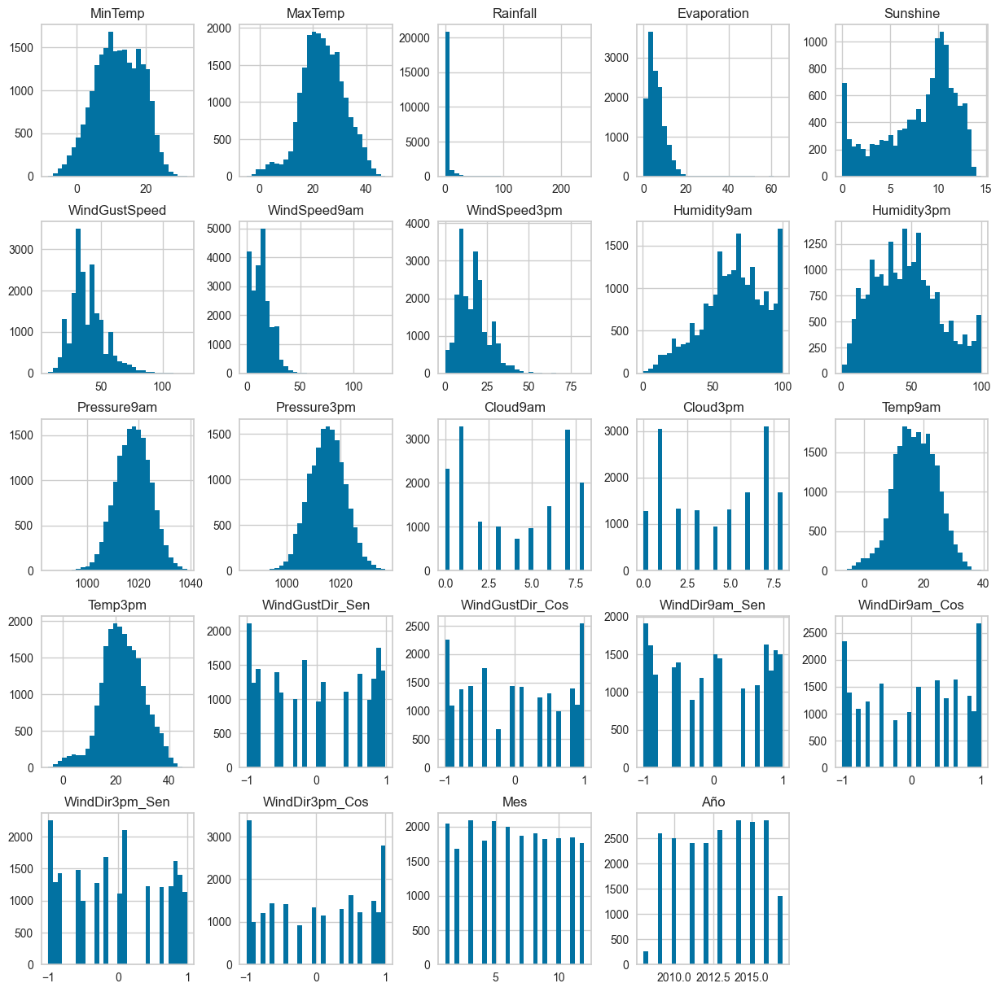

In [15]:
# Generamos un histograma para visualizar la distribución de cada columna del dataset,
# excluyendo la variable a predecir ('RainTomorrow').
print('HISTOGRAM')
print('')
# Creamos histogramas de todas las columnas de X_train en una figura con un diseño ajustado.
X_train.hist(bins=30, figsize=(15, 15))
# Mostramos la figura con todos los histogramas.
plt.show()

Conclusión: podemos observar que muchas de las variables se muestran de manera gaussiana como por ejemplo 'MinTemp'. Otras la vemos más sesgadas hacia uno de los laterales como por ejemplo 'Humidity9am' y las demás son variables categóricas transformadas que no presentan un patrón.


PAIRPLOT



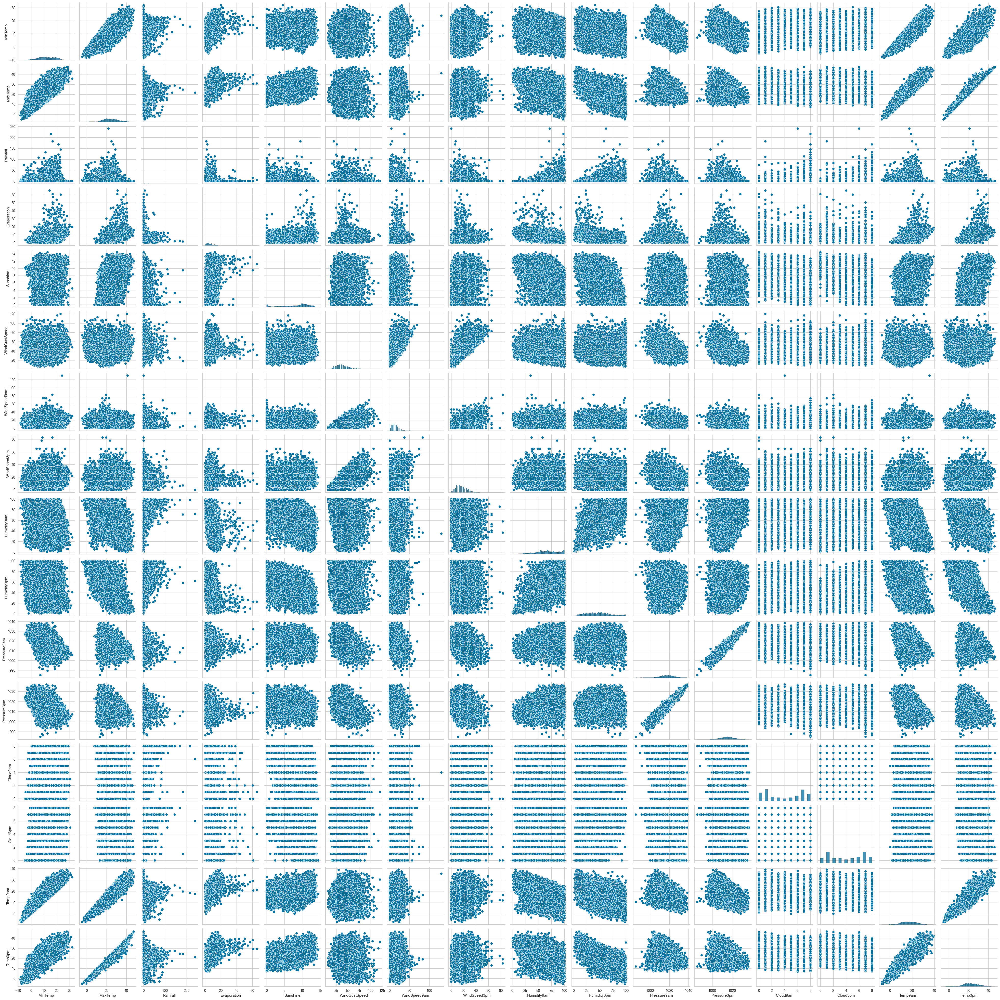

In [16]:
# Creamos un pairplot para comparar todas las columnas seleccionadas entre sí y observar cómo se relacionan,
# excluyendo la variable a predecir ('RainTomorrow').
print('')
print('PAIRPLOT')
print('')

# No utilizamos todas las variables, ya que las variables transformadas, como las dummies y las seno-coseno,
# no tienen una relación directa que permita obtener una noción completa de la variable original para comparar.
sns.pairplot(X_train[['MinTemp', 'MaxTemp', 'Rainfall', 'Evaporation', 'Sunshine',
       'WindGustSpeed', 'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am',
       'Humidity3pm', 'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm',
       'Temp9am', 'Temp3pm']])
plt.show()


Conclusión:

Podemos observar que en la mayoría de los casos las relaciones entre las variables forman nubes de puntos dispersas, lo que indica que no tienen una relación clara. Sin embargo, hay algunas excepciones:
- Las variables ‘Temp9am’, ‘Temp3pm’, ‘MinTemp’ y ‘MaxTemp’ muestran una relación lineal positiva: a medida que una aumenta, las otras también tienden a aumentar.
- De manera similar, ‘Pressure9am’ y ‘Pressure3pm’ tienen una relación lineal positiva entre sí.

Además, observamos ciertas características interesantes en otras variables:
- ‘Rainfall’, ‘Evaporation’, ‘WindSpeed9am’ y ‘WindSpeed3pm’ tienden a concentrarse en valores pequeños. Esto significa que la mayoría de los datos están acumulados en valores bajos de estas variables, mientras que las variables con las que se comparan muestran una mayor variabilidad en todo su rango.


BOXPLOT



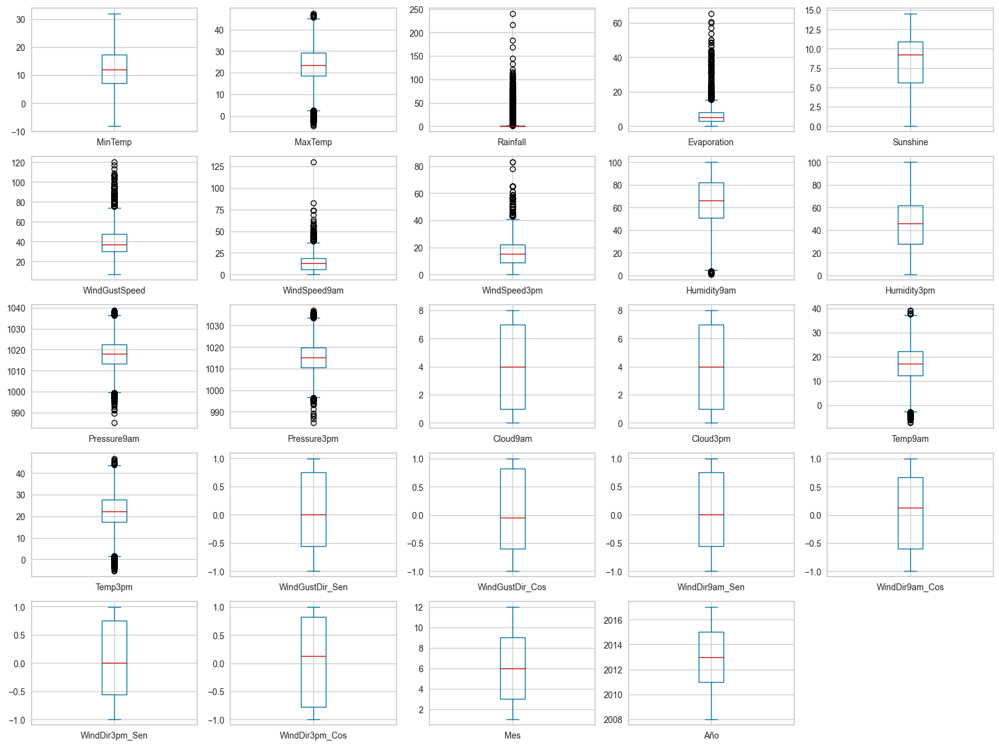

In [17]:
# Generamos un boxplot para visualizar la distribución y los valores atípicos de todas las variables,
# excepto la variable a predecir ('RainTomorrow').
print('')
print('BOXPLOT')
print('')
# Creamos un boxplot para cada variable en el dataset de entrenamiento.
X_train.plot(kind='box', subplots=True, layout=(5,5), figsize=(20, 15))
# Mostramos los boxplots.
plt.show()

Conclusión:

Hemos generado los boxplots para todas las variables. Observamos que en las variables ‘WindSpeed9am’, ‘Rainfall’, ‘WindSpeed3pm’ y ‘Evaporation’ es posible identificar valores atípicos. En los demás boxplots, aunque algunos puntos se encuentran fuera de los bigotes, no los consideramos valores atípicos debido a la cantidad considerable de datos que se visualizan en esas regiones, lo que sugiere que forman parte del conjunto principal de datos.

Decidimos no eliminar los valores atípicos, ya que consideramos que estos no se desvían de forma significativa de los rangos establecidos en los boxplots, excepto en el caso de ‘Rainfall’, donde identificamos aproximadamente 4 valores que podrían considerarse atípicos. Sin embargo, eliminar estos valores implicaría la eliminación de registros completos, y preferimos conservarlos, ya que podrían corresponder a casos reales importantes para el análisis.


In [18]:
def mixed_method(X_train, X_test, columns_mean, columns_median, columns_mode, columns_knn):
# Imputación de valores faltantes utilizando un "MÉTODO MIXTO".
    # Se realiza imputación estadística (SimpleImputer) para algunas columnas y KNNImputer para otras.

    # Creación de imputadores para diferentes estrategias.
  imputer_mean = SimpleImputer(strategy='mean')
  imputer_median = SimpleImputer(strategy='median')
  imputer_mode = SimpleImputer(strategy='most_frequent')
  imputer_knn = KNNImputer(n_neighbors=5)

    # Creación de un ColumnTransformer para aplicar diferentes estrategias de imputación por columna.
  preprocessor = ColumnTransformer(
      transformers=[
          ('mean', imputer_mean, columns_mean),
          ('median', imputer_median, columns_median),
          ('mode', imputer_mode, columns_mode),
          ('knn', imputer_knn, columns_knn)
      ],
      remainder='passthrough'
  )

    # Creación de un pipeline que incluye el preprocesador y el escalado de los datos.
  pipeline = Pipeline(steps=[
      ('preprocessor', preprocessor),
      ('scaler', StandardScaler())
  ])

    # Aplicación del pipeline a los datos de entrenamiento y prueba.
  X_train_scaled = pipeline.fit_transform(X_train)
  X_test_scaled = pipeline.transform(X_test)
    # Retornar los datos preprocesados y escalados.
  return X_train_scaled , X_test_scaled

In [19]:
# Hemos seleccionado un método de imputación de valores faltantes específico para cada columna,
# basado en las distribuciones observadas en las gráficas:
# - Para distribuciones más gaussianas, aplicamos la **media**.
# - Para columnas con datos concentrados en un rango muy pequeño, aplicamos la **moda**.
# - Para columnas con sesgos hacia alguno de los extremos, aplicamos la **mediana**.
# - Para el resto de las columnas, utilizamos el método de imputación de **K vecinos**,
#   para que el valor a imputar tenga en cuenta los valores de los vecinos.

mean= ['MinTemp', 'MaxTemp', 'WindGustSpeed', 'Pressure9am', 'Pressure3pm', 'Temp9am', 'Temp3pm']

mode = [ 'Rainfall','Sunshine', 'WindSpeed9am']

median = ['Humidity9am','Humidity3pm', 'Evaporation', 'WindSpeed3pm']

knn = ['Cloud9am', 'Cloud3pm','Location_Brisbane', 'Location_Mildura',
       'Location_Moree', 'Location_MountGambier', 'Location_MountGinini',
       'Location_Newcastle', 'Location_Penrith', 'Location_SydneyAirport',
       'Location_Uluru','RainToday_Yes', 'WindGustDir_Sen', 'WindGustDir_Cos',
       'WindDir9am_Sen', 'WindDir9am_Cos', 'WindDir3pm_Sen', 'WindDir3pm_Cos']

# Aplicamos el método mixto de imputación y escalado.
X_train_scaled , X_test_scaled = mixed_method(X_train,X_test,mean,median,mode,knn)
# Preparamos los datos escalados para realizar gráficos con SHAP.
X_train_scaled_shap = X_train_scaled
X_test_scaled_shap = X_test_scaled


# Convertimos los datos escalados en DataFrames con las mismas columnas originales,
# para realizar la regresión logística u otros análisis posteriores.
X_train_scaled = pd.DataFrame(X_train_scaled, columns=X_train.columns)
X_test_scaled = pd.DataFrame(X_test_scaled, columns=X_test.columns)

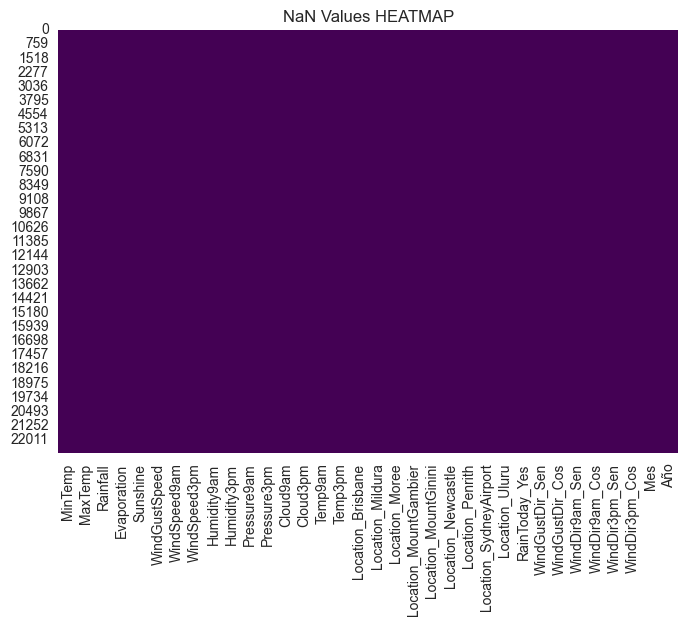

In [20]:
# Corroboramos que no hay valores faltantes en nuestro dataset de entrenamiento ya escalado.
sns.heatmap(X_train_scaled.isnull(), cbar=False, cmap='viridis')
plt.title('NaN Values HEATMAP')
plt.show()

Podemos confirmar que ya no tenemos valores faltantes en nuestro dataset de entrenamiento. Completamos los valores nulos utilizando estrategias de imputación basadas en la distribución de cada variable:
- Media: para variables con distribuciones más gaussianas.
- Mediana: para variables con sesgos hacia alguno de los extremos.
- Moda: para variables con valores concentrados en un rango pequeño.
- KNN: para variables cíclicas, como las direcciones del viento o las horas, aprovechando la relación con sus vecinos más cercanos.

Finalmente, escalamos los datos utilizando StandardScaler(), asegurando que todas las características están en una escala comparable, lo que es esencial para mejorar el rendimiento de los modelos predictivos.

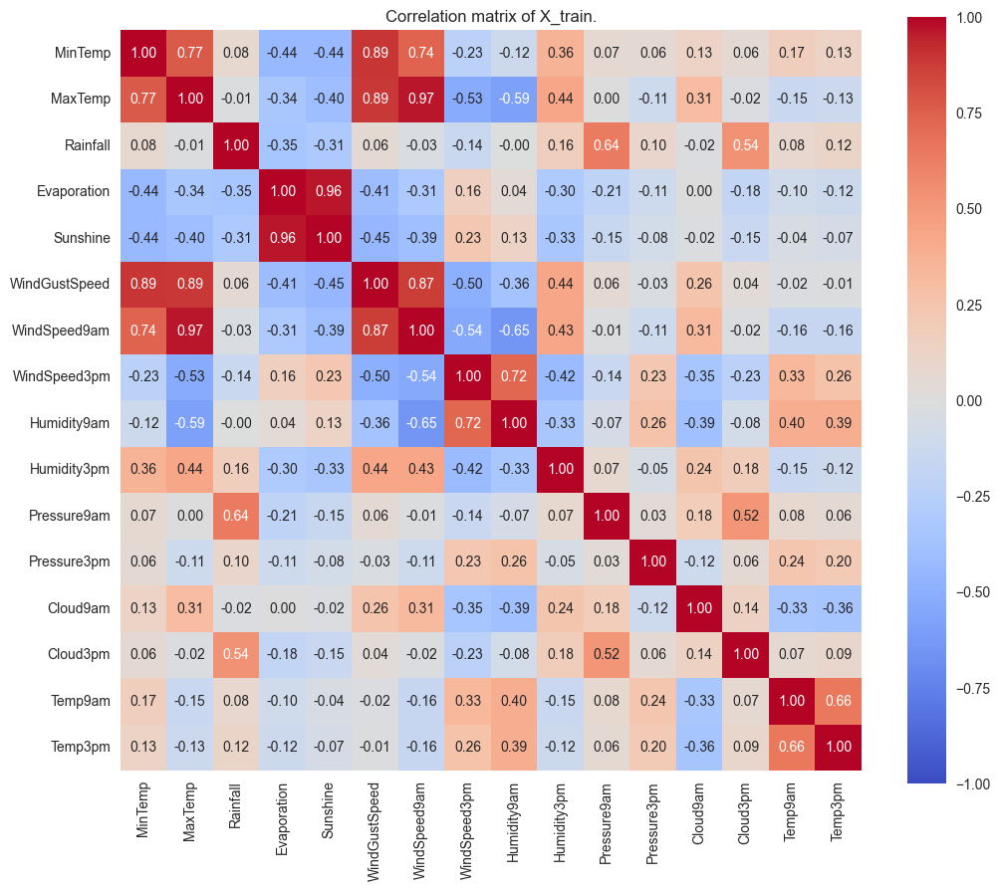

In [21]:
# Mostramos la relación positiva, negativa o nula entre las columnas seleccionadas de X_train.
# No seleccionamos todas las columnas, ya que las variables dummy no aportan información relevante a la correlación,
# pues sus valores tienden a estar cerca de 0.
corr_train = X_train_scaled[['MinTemp', 'MaxTemp', 'Rainfall', 'Evaporation', 'Sunshine',
       'WindGustSpeed', 'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am',
       'Humidity3pm', 'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm',
       'Temp9am', 'Temp3pm']].corr()

# Configuramos la visualización de la matriz de correlación.
plt.figure(figsize=(12, 10))
sns.heatmap(corr_train, annot=True, cmap='coolwarm', vmin=-1, vmax=1, center=0,square=True,fmt='.2f',annot_kws = {'size':10})
plt.title('Correlation matrix of X_train.')
plt.show()

Conclusión: vemos un análisis parecido al del pairplot.


# Ejercicio 2

In [22]:
def metricas (y_test, y_pred):
  '''
  Calculamos métricas básicas de evaluación.
  Estas métricas son útiles para entender la proporción de verdaderos positivos (VP)
  y verdaderos negativos (VN) en las predicciones del modelo.
  '''
  accuracy = accuracy_score(y_test, y_pred)
  precision = precision_score(y_test, y_pred)
  recall = recall_score(y_test, y_pred)
  f1 = f1_score(y_test, y_pred)

  #-------------------------------------------------------------------------------------------------------------------------------

  # Balanced Accuracy: promedio entre la sensibilidad para las clases positiva y negativa.
  balanced_accuracy = balanced_accuracy_score(y_test, y_pred)

  #-------------------------------------------------------------------------------------------------------------------------------

  # Especificidad: proporción de verdaderos negativos entre todos los negativos reales.
  # En sklearn, esto se calcula como el recall para la clase negativa (etiquetada como 0).
  specificity = recall_score(y_test, y_pred, pos_label=0)

  #-------------------------------------------------------------------------------------------------------------------------------

  # Matriz de Confusión: muestra los verdaderos positivos, negativos y los errores del modelo.
  conf_matrix = confusion_matrix(y_test, y_pred)
  disp = ConfusionMatrixDisplay(confusion_matrix=conf_matrix, display_labels=["No Lluvia", "Lluvia"])
  disp.plot(cmap='Blues')
  plt.title("Matriz de Confusión")
  plt.show()

  #-------------------------------------------------------------------------------------------------------------------------------

  # Mostramos todas las métricas calculadas.
  print(f"Balanced Accuracy: {balanced_accuracy:.4f}")
  print(f"Especificidad (Specificity): {specificity:.4f}")
  print(f"Exactitud (Accuracy): {accuracy:.4f}")
  print(f"Precisión (Precision): {precision:.4f}")
  print(f"Sensibilidad (Recall): {recall:.4f}")
  print(f"F1 Score: {f1:.4f}")

  # Mostramos el reporte de clasificación, que incluye métricas adicionales por clase.
  print("Reporte de Clasificación:")
  print(classification_report(y_test, y_pred))


In [23]:
def ROC_AUC(X_test_scaled, y_test, modelo_entrenado):
  """
    Calcula y grafica la curva ROC junto con el área bajo la curva (AUC).

    Args:
    X_test_scaled: Conjunto de características de prueba escaladas.
    y_test: Valores reales de la clase objetivo en el conjunto de prueba.
    modelo_entrenado: Modelo previamente entrenado que será evaluado.

    Returns:
    fpr: Tasa de falsos positivos (False Positive Rate) en diferentes umbrales.
    tpr: Tasa de verdaderos positivos (True Positive Rate) en diferentes umbrales.
    thresholds: Umbrales utilizados para calcular FPR y TPR.
  """

  # Calculamos las probabilidades predichas para la clase positiva (1).
  y_pred_proba = modelo_entrenado.predict_proba(X_test_scaled)[:, 1]

  # Calculamos las tasas FPR (False Positive Rate) y TPR (True Positive Rate), así como los umbrales correspondientes.
  fpr, tpr, thresholds = roc_curve(y_test, y_pred_proba)

  # Calculamos el área bajo la curva (AUC).
  roc_auc = auc(fpr, tpr)

  # Graficamos la curva ROC
  plt.figure(figsize=(6, 4))
  plt.plot(fpr, tpr, color='darkorange', lw=2, label='Curva ROC (AUC = %0.2f)' % roc_auc)
  plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
  plt.xlim([0.0, 1.0])
  plt.ylim([0.0, 1.05])
  plt.xlabel('Tasa de Falsos Positivos (FPR)')
  plt.ylabel('Tasa de Verdaderos Positivos (TPR)')
  plt.title('Curva ROC')
  plt.legend(loc="lower right")
  plt.show()
  return fpr, tpr, thresholds

## Modelo de Regresión Logística binario

In [24]:
# Inicializamos y entrenamos un modelo de regresión logística.
# Usamos random_state=42 para garantizar la reproducibilidad de los resultados.
model = LogisticRegression(random_state=42)
model.fit(X_train_scaled, y_train)

# Realizamos las predicciones en el conjunto de prueba.
y_pred = model.predict(X_test_scaled)

In [25]:
MODELO_LOGISTICO = model

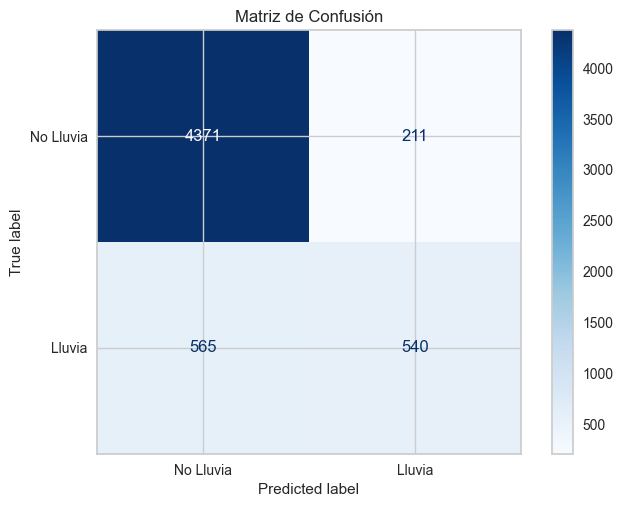

Balanced Accuracy: 0.7213
Especificidad (Specificity): 0.9540
Exactitud (Accuracy): 0.8635
Precisión (Precision): 0.7190
Sensibilidad (Recall): 0.4887
F1 Score: 0.5819
Reporte de Clasificación:
              precision    recall  f1-score   support

           0       0.89      0.95      0.92      4582
           1       0.72      0.49      0.58      1105

    accuracy                           0.86      5687
   macro avg       0.80      0.72      0.75      5687
weighted avg       0.85      0.86      0.85      5687



In [26]:
metricas(y_test, y_pred)

*La Accuracy NO tomamos esta métrica en cuenta porque nuestro dataset está desbalanceado y no es representativa. 

*La precisión nos indica que la proporción de (No Lluvia) sobre el total de predicciones es de 71.52% significa que, cuando el modelo predice que va a llover, hay una buena probabilidad de que realmente no llueva. Sin embargo.

*El recall mide la capacidad del modelo para identificar correctamente todos los casos positivos. Con un 48.87%, esto sugiere que el modelo no está detectando bien los días de lluvia. Esto es un punto débil, especialmente si queremos minimizar la cantidad de días de lluvia no detectados (falsos negativos).

*El F1 Score tiene un valor de 0.5806 que indica un equilibrio entre precisión y recall. Dado que la sensibilidad es relativamente baja, esto impacta negativamente el F1 Score. Este resultado resalta la dificultad del modelo para captar los casos de lluvia.

*La exactitud balanceada tiene en cuenta el desempeño del modelo en ambas clases, tanto en "lluvia" como en "no lluvia". Un 72.09% indica que el modelo tiene un rendimiento razonable, pero aún puede mejorar en la detección de la clase minoritaria (lluvia).

*La exactitud balanceada tiene un 72.09%  que indica que el modelo tiene un rendimiento razonable, pero aún puede mejorar en la detección de la clase más chica (lluvia).

*La especificidad mide la capacidad del modelo para identificar correctamente los días en que no lloverá. Un 95.31% es muy alto, lo que significa que el modelo es excelente para predecir los días que no lloverán, pero esto también sugiere que puede estar sesgado hacia la predicción de "no lluvia".

conclusión: como tenemos un modelo que predice más días que no llueve que los demás, porque tiene muchos más valores donde son días que no llovió.


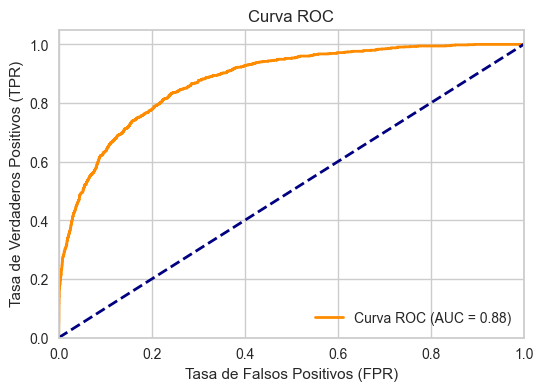

In [27]:
fpr_model, tpr_model, thresholds_model = ROC_AUC(X_test_scaled, y_test, model)

In [28]:
# Calculamos el umbral óptimo
optimal_idx_model = np.argmax(tpr_model - fpr_model)
optimal_threshold_model = thresholds_model[optimal_idx_model]

print("Umbral óptimo:", optimal_threshold_model)

Umbral óptimo: 0.16499751723562178


Podemos ver como varía el umbral, siendo siempre mejor que predecirlo aleatoriamente. Obtenemos un umbral muy bajo porque nuestro dataset está desbalanceado. Por esta causa tenemos que la mayoría de los registros son predichos que no llueven y muchos de esos son días que si llovieron por eso el umbral es tan bajo para equilibrar ese desbalance del dataset.

## Modelo con muestreo balanceado

In [29]:
# Modelo con muestreo de clase
logistic_class_weight = LogisticRegression(class_weight='balanced')
logistic_class_weight.fit(X_train_scaled, y_train)

# Evaluación
y_pred_balanced= logistic_class_weight.predict(X_test_scaled)

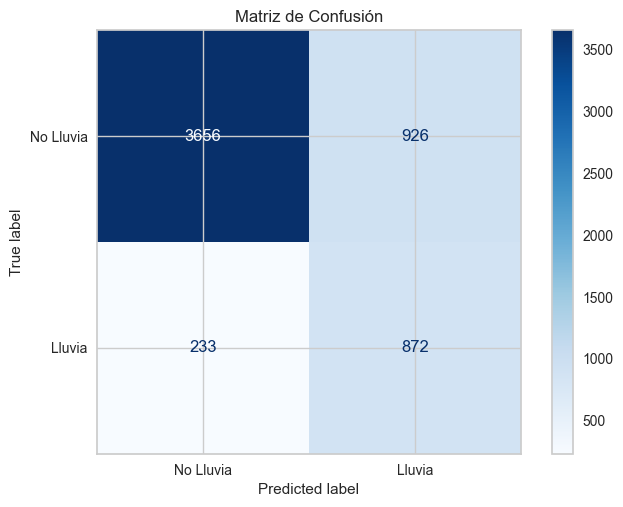

Balanced Accuracy: 0.7935
Especificidad (Specificity): 0.7979
Exactitud (Accuracy): 0.7962
Precisión (Precision): 0.4850
Sensibilidad (Recall): 0.7891
F1 Score: 0.6008
Reporte de Clasificación:
              precision    recall  f1-score   support

           0       0.94      0.80      0.86      4582
           1       0.48      0.79      0.60      1105

    accuracy                           0.80      5687
   macro avg       0.71      0.79      0.73      5687
weighted avg       0.85      0.80      0.81      5687



In [30]:
metricas(y_test, y_pred_balanced)

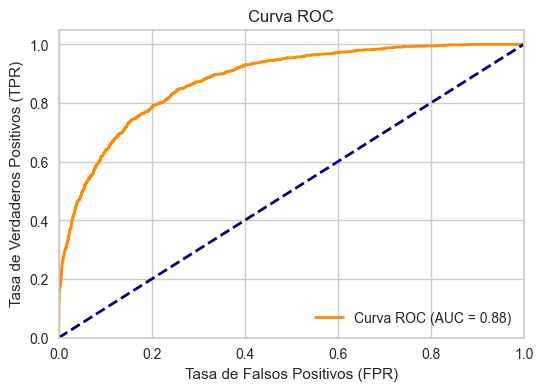

In [31]:
fpr_balanced, tpr_balanced, thresholds_balanced = ROC_AUC(X_test_scaled, y_test, logistic_class_weight)

In [32]:
# Calculamos el umbral óptimo
optimal_idx_balanced = np.argmax(tpr_balanced - fpr_balanced)
optimal_threshold_balanced = thresholds_balanced[optimal_idx_balanced]

print("Umbral óptimo:", optimal_threshold_balanced)

Umbral óptimo: 0.4327622493064577


Podemos ver como varía el umbral, siendo siempre mejor que la que predecirlo aleatoriamente. En este modelo vemos que el umbral subió bastante, pero podemos decir que todavía tiene un umbral bajo por el la tendencia a predecir días que llueven como que no llueve.


## Modelo de Regresión Logística con Oversampling

In [33]:
# Remuestreo con Oversampling (RandomOverSampler)
# https://imbalanced-learn.org/stable/references/generated/imblearn.over_sampling.RandomOverSampler.html

oversampler = RandomOverSampler(random_state=42)
X_resampled, y_resampled = oversampler.fit_resample(X_train_scaled, y_train)
len(y_resampled[y_resampled==1]), len(y_resampled[y_resampled==0])

# Modelo con muestreo de clase
logistic_oversampler = LogisticRegression()
logistic_oversampler.fit(X_resampled, y_resampled)

# Evaluación
y_pred_over = logistic_oversampler.predict(X_test_scaled)

In [34]:
MODELO_LOGISTICO_OVERSAMPLER = logistic_oversampler

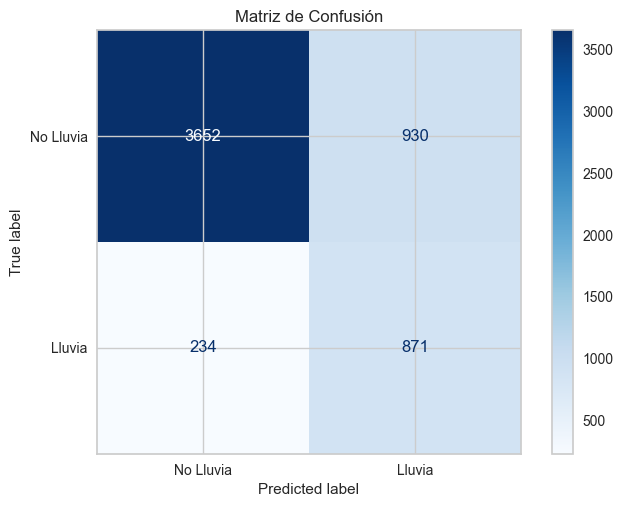

Balanced Accuracy: 0.7926
Especificidad (Specificity): 0.7970
Exactitud (Accuracy): 0.7953
Precisión (Precision): 0.4836
Sensibilidad (Recall): 0.7882
F1 Score: 0.5994
Reporte de Clasificación:
              precision    recall  f1-score   support

           0       0.94      0.80      0.86      4582
           1       0.48      0.79      0.60      1105

    accuracy                           0.80      5687
   macro avg       0.71      0.79      0.73      5687
weighted avg       0.85      0.80      0.81      5687



In [35]:
metricas(y_test, y_pred_over)

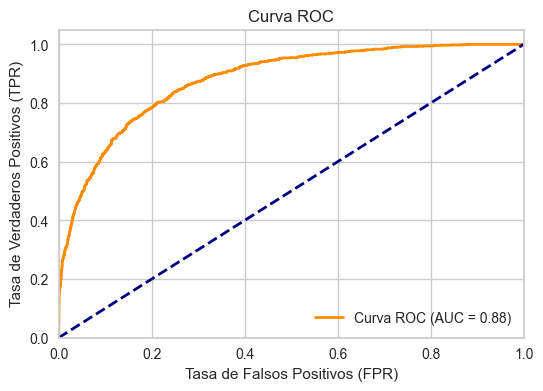

In [36]:
fpr_over, tpr_over, thresholds_over = ROC_AUC(X_test_scaled, y_test, logistic_oversampler)

In [37]:
# Calculamos el umbral óptimo
optimal_idx_over = np.argmax(tpr_over - fpr_over)
optimal_threshold_over = thresholds_over[optimal_idx_over]

print("Umbral óptimo:", optimal_threshold_over)

Umbral óptimo: 0.48725842533677266


Podemos observar cómo varía el umbral, siendo siempre mejor que predecir de manera aleatoria. Es similar al modelo balanceado, aunque este presenta un umbral ligeramente más bajo.

El mejor umbral se calcula restando TPR y FPR, y seleccionando el valor máximo, lo que nos permite identificar los puntos donde TPR es alto y FPR es bajo. Posteriormente, utilizamos los thresholds para determinar el umbral óptimo. Nuestro código devuelve un umbral óptimo de 0.443 para el modelo de regresión logística balanceado por pesos, mientras que el modelo de regresión logística con oversampling arroja un valor casi idéntico de 0.439.

Aunque el mejor umbral no es exactamente 0.5, se encuentra muy cerca de este valor.

Consideramos que el modelo no tiene un buen ajuste (fitting), ya que las métricas basadas en el F1 Score muestran un promedio bajo de alrededor de 0.6. Además, se observa una cantidad significativa de falsos negativos y falsos positivos dependiendo de cada modelo. Esto nos lleva a concluir que, si bien supera a un modelo base, la calidad de las predicciones sigue siendo limitada.

# Ejercicio 3

In [38]:
y_pred_random_np = np.random.randint(2, size=len(list(y_test)))

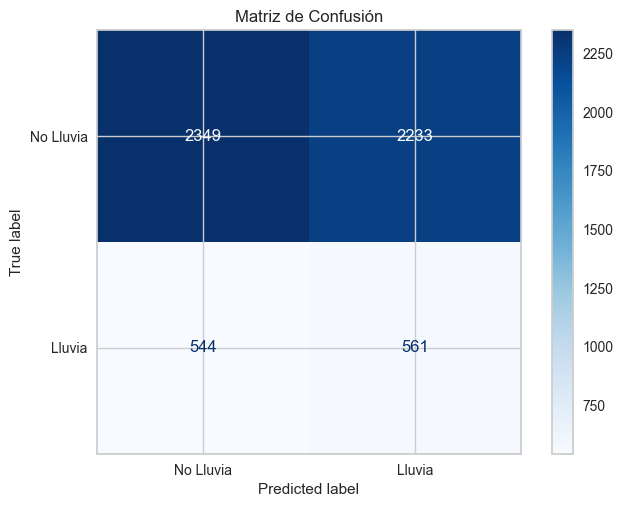

Balanced Accuracy: 0.5102
Especificidad (Specificity): 0.5127
Exactitud (Accuracy): 0.5117
Precisión (Precision): 0.2008
Sensibilidad (Recall): 0.5077
F1 Score: 0.2878
Reporte de Clasificación:
              precision    recall  f1-score   support

           0       0.81      0.51      0.63      4582
           1       0.20      0.51      0.29      1105

    accuracy                           0.51      5687
   macro avg       0.51      0.51      0.46      5687
weighted avg       0.69      0.51      0.56      5687



In [39]:
metricas(y_test, y_pred_random_np)

La predicción con el modelo base es muy burda y provoca una gran predicción de falsos positivos, y los falsos negativos son iguales que los verdaderos negativos. Tiene un F1 = 0.243, lo cual es bastante bajo y confirma lo pésimo que es este modelo. Además, este modelo fue el que tuvo la menor cantidad de verdaderos positivos.

No se puede hacer el gráfico de la Curva ROC, ya que no tenemos un modelo de sklearn.

# Ejercicio 4

Justificación de cada método:

1.	Grid Search: Es exhaustivo y garantiza encontrar el mejor valor en el conjunto especificado, pero es costoso en términos de tiempo cuando se aumenta el número de combinaciones.
2.	Random Search: Más rápido que Grid Search, ya que no prueba todas las combinaciones, sino una selección aleatoria. Es útil cuando hay muchos hiperparámetros y quieres reducir el costo computacional.
3.	Optuna: Emplea búsqueda bayesiana, que permite optimizar el proceso adaptándose a los resultados anteriores. Es ideal para espacios grandes y complejos de hiperparámetros, proporcionando eficiencia y mejores resultados en la mayoría de los casos.

In [40]:
warnings.filterwarnings("ignore")

# Definimos el modelo
modelo_1 = LogisticRegression(random_state=42, class_weight='balanced')

# Configuración de validación cruzada k-fold
kfold = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

# Evaluación inicial usando validación cruzada k-fold para el modelo base con exactitud
base_scores = cross_val_score(modelo_1, X_train_scaled, y_train, cv=kfold, scoring='accuracy')
print(f"Exactitud promedio del modelo base (validación cruzada k-fold): {base_scores.mean():.4f}")


#-------------------------------------------------------------------------------------------------------------------------------

# Hiperparámetros a optimizar
# Hiperparámetros a optimizar
param_dist = {
    'C': [0.01, 0.1, 1, 10, 100, 300, 500],
    'solver': ['liblinear', 'saga', 'lbfgs', 'newton-cg', 'sag'],
    'penalty': ['l1', 'l2', 'elasticnet'],
    'max_iter': [10, 50, 100, 500, 1000, 5000, 10000, 100000]
}

# las métricas para evaluar el desempeño.
scoring = {
    'accuracy': make_scorer(accuracy_score),
    'precision': make_scorer(precision_score),
    'recall': make_scorer(recall_score),
    'f1': make_scorer(f1_score)
}

print('\n#--------------------------------------------------------------------------------------------------------------------------------------------------\n')
#-------------------------------------------------------------------------------------------------------------------------------

# Definimos el modelo para Grid Search
modelo_grid = LogisticRegression(random_state=42, class_weight='balanced')

# 1. Grid Search para optimización de hiperparámetros
grid_search = GridSearchCV(estimator=modelo_grid, param_grid=param_dist, cv=kfold, scoring=scoring, refit='f1')
grid_search.fit(X_train_scaled, y_train)
y_pred_grid = grid_search.best_estimator_.predict(X_test_scaled)

MODELO_GRID = grid_search.best_estimator_

# Calcular métricas del mejor modelo
accuracy_grid = accuracy_score(y_test, y_pred_grid)
precision_grid = precision_score(y_test, y_pred_grid)
recall_grid = recall_score(y_test, y_pred_grid)
f1_grid = f1_score(y_test, y_pred_grid)

# Imprimir las métricas
print("\n**Mejores Hiperparámetros:**", grid_search.best_params_)
print(f"**Accuracy:** {accuracy_grid:.4f}")
print(f"**Precision:** {precision_grid:.4f}")
print(f"**Recall:** {recall_grid:.4f}")
print(f"**F1-Score:** {f1_grid:.4f}")

print('\n#--------------------------------------------------------------------------------------------------------------------------------------------------\n')
#-------------------------------------------------------------------------------------------------------------------------------

# Definimos el modelo para Random Search
modelo_random = LogisticRegression(random_state=42, class_weight='balanced')

# 2. Random Search para optimización de hiperparámetros
random_search = RandomizedSearchCV(estimator=modelo_random, param_distributions=param_dist, cv=kfold, n_iter=10, scoring=scoring, random_state=42, refit='f1')
random_search.fit(X_train_scaled, y_train)
y_pred_random = random_search.best_estimator_.predict(X_test_scaled)

MODELO_RANDOM = random_search.best_estimator_

# Calcular métricas del mejor modelo
accuracy_random = accuracy_score(y_test, y_pred_random)
precision_random = precision_score(y_test, y_pred_random)
recall_random = recall_score(y_test, y_pred_random)
f1_random = f1_score(y_test, y_pred_random)

# Imprimir las métricas
print("\n**Mejores Hiperparámetros:**", random_search.best_params_)
print(f"**Accuracy:** {accuracy_random:.4f}")
print(f"**Precision:** {precision_random:.4f}")
print(f"**Recall:** {recall_random:.4f}")
print(f"**F1-Score:** {f1_random:.4f}")


print('\n#--------------------------------------------------------------------------------------------------------------------------------------------------\n')
#-------------------------------------------------------------------------------------------------------------------------------

# 3. Optuna para optimización de hiperparámetros
def objective(trial):
    C = trial.suggest_loguniform('C', 1e-3, 1e2)
    solver = trial.suggest_categorical('solver', ['liblinear', 'saga'])
    # Definir la penalización según el solver
    penalty = trial.suggest_categorical('penalty', ['l1', 'l2']) if solver != 'liblinear' else 'l2'

    model = LogisticRegression(C=C, solver=solver, penalty=penalty, class_weight='balanced', random_state=42)
    # Validación cruzada usando scoring de precisión
    scores = cross_val_score(model, X_train_scaled, y_train, cv=kfold, scoring='accuracy')
    return scores.mean()

# Crear y ejecutar el estudio de Optuna
study = optuna.create_study(direction='maximize')
study.optimize(objective, n_trials=20)

# Obtener los mejores hiperparámetros y entrenar el mejor modelo
best_params = study.best_params
best_model = LogisticRegression(C=best_params['C'], solver=best_params['solver'], penalty=best_params['penalty'], class_weight='balanced', random_state=42)
best_model.fit(X_train_scaled, y_train)

MODELO_BEST = best_model

# Realizar predicciones con el mejor modelo
y_pred_optuna = best_model.predict(X_test_scaled)

# Calcular métricas del mejor modelo
accuracy_optuna = accuracy_score(y_test, y_pred_optuna)
precision_optuna = precision_score(y_test, y_pred_optuna)
recall_optuna = recall_score(y_test, y_pred_optuna)
f1_optuna = f1_score(y_test, y_pred_optuna)

# Imprimir las métricas
print("\n**Mejores Hiperparámetros:**", study.best_params)
print(f"**Accuracy:** {accuracy_optuna:.4f}")
print(f"**Precision:** {precision_optuna:.4f}")
print(f"**Recall:** {recall_optuna:.4f}")
print(f"**F1-Score:** {f1_optuna:.4f}")

Exactitud promedio del modelo base (validación cruzada k-fold): 0.7963

#--------------------------------------------------------------------------------------------------------------------------------------------------


**Mejores Hiperparámetros:** {'C': 0.1, 'max_iter': 10, 'penalty': 'l2', 'solver': 'sag'}
**Accuracy:** 0.7953
**Precision:** 0.4836
**Recall:** 0.7891
**F1-Score:** 0.5997

#--------------------------------------------------------------------------------------------------------------------------------------------------



[I 2024-12-12 17:53:49,154] A new study created in memory with name: no-name-200d119b-6f19-46de-85ef-844a0ed6e4b2



**Mejores Hiperparámetros:** {'solver': 'liblinear', 'penalty': 'l2', 'max_iter': 10000, 'C': 300}
**Accuracy:** 0.7964
**Precision:** 0.4853
**Recall:** 0.7900
**F1-Score:** 0.6012

#--------------------------------------------------------------------------------------------------------------------------------------------------



[I 2024-12-12 17:53:50,034] Trial 0 finished with value: 0.7896954915824997 and parameters: {'C': 0.00590532197178688, 'solver': 'saga', 'penalty': 'l1'}. Best is trial 0 with value: 0.7896954915824997.
[I 2024-12-12 17:53:50,801] Trial 1 finished with value: 0.796465369758841 and parameters: {'C': 29.257345646171938, 'solver': 'liblinear'}. Best is trial 1 with value: 0.796465369758841.
[I 2024-12-12 17:53:51,484] Trial 2 finished with value: 0.7964213943892994 and parameters: {'C': 3.5330599723659626, 'solver': 'liblinear'}. Best is trial 1 with value: 0.796465369758841.
[I 2024-12-12 17:53:52,088] Trial 3 finished with value: 0.7936080626342223 and parameters: {'C': 0.025583508594258595, 'solver': 'liblinear'}. Best is trial 1 with value: 0.796465369758841.
[I 2024-12-12 17:53:53,808] Trial 4 finished with value: 0.796465369758841 and parameters: {'C': 30.035615321899126, 'solver': 'saga', 'penalty': 'l2'}. Best is trial 1 with value: 0.796465369758841.
[I 2024-12-12 17:53:54,486] T

KeyError: 'penalty'

Utilizamos el modelo balanceado, el cual fue el que nos dio la mejor métrica cuando entrenamos el modelos sin hiperparametros, con un Accuracy = 0.7951. El primer modelo no lo tomamos como uno, ya que tenemos mucho desbalance y no podemos calcular su Accuracy y puede estar influenciado su desempeño por dicho desbalance.

Entrenamos los 3 optimizadores de hiperparametros para ver cual nos daba un mejor resultado en un menor tiempo. El mejor Accuracy nos los dio Optuna() con un valor de 0.7957 y tambien un mejor valor de F1 con un valor de 0.5990 y siguiéndolo el GridSearchCV() con un valor de 0.7955 y RandomSearchCV() nos dio un valor de 0.7951. Siendo el GridSearchCV, el RandomizedSearchCV  y erl Optuna practicamnete iguales. Contábamos con una cantidad de hiperparametros de 4, los cuales son:


- C :  [0.01, 0.1, 1, 10, 100, 300, 500]. Donde este hiper parámetro controla la fuerza de la regularización en el modelo. La cual se utiliza para evitar el sobreajuste. Cuanto menor es el valor de C, más fuerte es la regularización y es más simple, pero con valores más grandes le da más complejidad al modelo y lo puede sobreajustar. Elegimos estos valores p0ara probar teniendo una muestra de un valor grande,  otro intermedio y los demás mas pequeños. Al principio quisimos hacer un rango de número flotantes pero el GridSearchCV, al realizar todas las combinaciones el tiempo en ejecucion aumentaba exponencialmente, por lo que optamos estos pocos valores.


- solver :  ['liblinear', 'saga', 'lbfgs', 'newton-cg', 'sag']. Este hiper parámetro lo que hace es optimizar la función de costo de la regresión logística. Cada hiper parámetro puede ser más eficiente dependiendo de la situación. Sabiendo que cada uno depende de la cantidad de datos o que penalidad tiene optamos por ponerlos a todos y que nos devuelva el mejor, ya que no eran muchos.



- penalty : ['l1', 'l2', 'elasticnet'].Este hiper parámetro define el tipo de penalización aplicada al modelo para regularizar la solución. Decidimos dejar los 3 ya que también el solver utiliza uno u otro.

- max_iter :[10, 50, 100, 500, 1000, 5000, 10000, 100000]. Este hiper parámetro establece el número máximo de iteraciones que el algoritmo de optimización puede realizar antes de detenerse. Si el algoritmo no ha convergido dentro de este número de iteraciones, se detendrá. Un valor pequeño como 100 puede ser suficiente para problemas simples, pero puede no ser suficiente para conjuntos de datos más grandes o más complejos. Un valor más alto permite más tiempo para que el modelo encuentre una solución convergente, especialmente en conjuntos de datos grandes o complejos.






Ejemplo de cuándo usar K-Fold

Si tienes un conjunto de datos pequeño o necesitas una validación robusta del rendimiento de tu modelo, K-Fold es ideal. Supón que estás desarrollando un modelo de clasificación para una enfermedad rara y tienes solo 500 muestras. Usar K-Fold permite que cada muestra contribuya tanto al entrenamiento como a la evaluación del modelo, maximizando así el valor de los datos.

Desventaja

Una consideración es que K-Fold puede ser computacionalmente intensivo, especialmente con modelos grandes o complejos, ya que se deben entrenar  K  modelos en lugar de uno solo. Sin embargo, esta carga adicional suele estar justificada por la mayor precisión en la evaluación del modelo.

En resumen, K-Fold Cross-Validation es una técnica valiosa para obtener una evaluación más precisa y reducir el sesgo, maximizando el uso de datos y brindando un buen marco para la optimización de hiperparámetros.

# Ejercicio 5

Implementar explicabilidad de los modelos.
- Utilizar SHAP o similar. Implementar al menos dos gráficas a nivel local y dos gráficas a nivel global. ¡Escribir lo que se observa! 
- ¿Cuáles son las variables más importantes? ¿Cuáles son las menos?


In [ ]:
# El mejor modelo es el balnceado ya que tiene menos falso positivos y falsos negativos.
# EXPLICAR MEJOR POR LAS DUDAS PORQUE LAS METRICAS SON MEJOR DEL BALANCEADO.
nom_columns = X_train_scaled.columns
# Crea un objeto explainer SHAP con el modelo que tiene oversampler.
shap_oversampling = shap.LinearExplainer(logistic_oversampler, X_train_scaled_shap, feature_names=nom_columns)

# Crea un objeto explainer SHAP con el modelo que tiene la clase balanceada (los pesos de la pre3diccion de lluvia).
shap_balanceado = shap.LinearExplainer(logistic_class_weight, X_train_scaled_shap, feature_names=nom_columns)

In [ ]:
# Calcula los valores SHAP para un conjunto de ejemplos de prueba con el modelo de oversampling
shap_values_oversampling = shap_oversampling.shap_values(X_test_scaled_shap)

# Calcula los valores SHAP para un conjunto de ejemplos de prueba con el modelo balanceado (los pesos de la prediccion de lluvia)
shap_values_balanceado = shap_balanceado.shap_values(X_test_scaled_shap)

In [ ]:
# La dimension del shap_values_balanceado
shape_values_balanceados = shap_values_balanceado.shape

values_balanceado_0 = shap_values_balanceado[0]

expected_shap_balanceado = shap_balanceado.expected_value # Guardar en variables y


In [ ]:
# La dimension del shap_values_oversampling
shape_values_oversample = shap_values_oversampling.shape

values_oversample = shap_values_oversampling[0]

expected_shap_oversampling = shap_oversampling.expected_value


## Interpretabilidad local


In [ ]:
# grafico del OVERSAMPLIG
index= 0
shap.force_plot(shap_oversampling.expected_value, shap_values_oversampling[index], X_test_scaled.iloc[index],
                feature_names=nom_columns, matplotlib=True, figsize=(18, 4),
                text_rotation=45)


In [ ]:
# grafico del OVERSAMPLIG
index=0

shap.force_plot(shap_balanceado.expected_value, shap_values_balanceado[index], X_test_scaled.iloc[index],
                feature_names=nom_columns, matplotlib=True, figsize=(18, 4),
                text_rotation=45)


In [ ]:
explanation = shap.Explanation(values=shap_values_oversampling[index], base_values=expected_shap_oversampling, feature_names=nom_columns)
plt.title("Modelo con oversampling", fontsize=16)
shap.plots.waterfall(explanation, max_display=35)

In [ ]:
explanation_1 = shap.Explanation(values=shap_values_balanceado[index], base_values=expected_shap_balanceado, feature_names=nom_columns)
plt.title("Modelo balanceado", fontsize=16)
shap.plots.waterfall(explanation_1, max_display=35)

Podemos observar que hay más variables que disminuyen la probabilidad base que aquellas que la incrementan. El valor base es negativo, lo que indica que el modelo, en general, tiene una tendencia negativa, es decir, tiende a predecir que no lloverá. Esto refleja una inclinación hacia la no lluvia al predecir si lloverá o no. Además, notamos que esta tendencia reduce la probabilidad de lluvia. Esta característica se observa claramente en ambas gráficas, aunque el modelo balanceado tiende a ser ligeramente más reductor de la probabilidad. Sin embargo, ambas gráficas son muy similares.

La variable que más disminuye la probabilidad es ‘Humidity9am’, seguida de ‘MaxTemp’, ‘Evaporation’ y ’Cloud9am. También hay otras variables que contribuyen a esta disminución, aunque con un peso menor. Por otro lado, las variables que más aumentan la probabilidad son ‘Sunshine’, ‘WindSpeed9am’, ‘Rainfall’ y ‘WindGustSpeed’, acompañadas por otras que incrementan la probabilidad, pero en menor medida.

Las variables que menos contribuyen al incremento de la probabilidad son ‘Año’, ‘Location_Newcastle’ y ‘WindGustDir_Sen’, con valores cercanos a +0. Por su parte, las que menos contribuyen a disminuir la probabilidad son ‘Location_Moree’, ‘Temp9am’ y ‘Pressure3pm’, con valores cercanos a -0.02.

Conclusión: Llegamos a la probabilidad de que el registro número 0 tiene una alta tendencia a que el modelo prediga que no lloverá, dado los parámetros proporcionados al modelo.

## Interpretabilidad global

In [ ]:
explanation = shap.Explanation(values=shap_values_oversampling, base_values=expected_shap_oversampling, feature_names=nom_columns, data=X_test_scaled_shap)
plt.title("Modelo con oversampling", fontsize=16)
shap.plots.bar(explanation, max_display=35)

In [ ]:
explanation_balanceado = shap.Explanation(values=shap_values_balanceado, base_values=expected_shap_balanceado, feature_names=nom_columns, data=X_test_scaled_shap)
plt.title("Modelo balanceado", fontsize=16)
shap.plots.bar(explanation_balanceado,max_display=20)

In [ ]:
plt.title("Modelo con oversampling", fontsize=16)
shap.plots.beeswarm(explanation,max_display=35)

In [ ]:
plt.title("Modelo balanceado", fontsize=16)
shap.plots.beeswarm(explanation_balanceado)

Observamos las gráficas de los dos modelos y notamos que son prácticamente iguales, por lo que explicaremos la del modelo con oversampling y, de manera análoga, la del modelo balanceado.

En la gráfica podemos identificar variables que son importantes al momento de tomar una decisión en la predicción, como ‘Humidity9am’ con un valor de +1.04, ‘Sunshine’ con un valor de +0.94, ‘Evaporation’ con un valor de +0.71, ‘MaxTemp’ con un valor de +0.67, ‘WindSpeed9am’ con un valor de +0.61, ‘Cloud9am’ con un valor de +0.45, entre otras variables cuyo impacto disminuye progresivamente. Estas, junto con muchas otras que no mencionamos debido a su cantidad, contribuyen a que el modelo realice predicciones basadas en los valores específicos de cada registro, determinando si lloverá o no.

Además, observamos cómo, a medida que aumenta cada variable, la probabilidad de que llueva o no cambia de manera proporcional. Por ejemplo, para ‘Location_MountGambier’, la mayoría de los registros no generan un aumento ni una disminución significativa en la probabilidad, permaneciendo cerca de cero, por no decir que es exactamente 0.

La variable ‘Humidity9am’ es la característica más influyente, con un valor alto, lo que indica que tiene el mayor efecto en las predicciones del modelo. ‘Sunshine’ le sigue en importancia, también con un impacto significativo. Otras variables como ‘Evaporation’, ‘MaxTemp’ y ‘WindSpeed9am’ tienen impactos notables en el modelo. Finalmente, encontramos variables relacionadas con la ubicación, como ‘Location_MountGambier’, ‘Location_Brisbane’ y ‘Location_MountGinini’, que también tienen un efecto importante, lo que sugiere que la geografía desempeña un papel crucial en las predicciones del modelo.

La variable más importante es la 'Humidity9am' con un valor de +1.04 y la menos importante es 'WindDir9am_sen' con un valor de +0.0

# Ejercicio 6

In [ ]:
X = weather_ten_cities.drop('RainTomorrow', axis=1)
y = weather_ten_cities['RainTomorrow']

# Dividimos nuestro conjunto de datos en dos partes, la parte de entrenamiento y la parte de prueba.
# La division que hacemos de los datos son de 80/20, donde el 80 es para entrenamiento y el 20 restante para hacer un testeo.
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Para hacer Regrecion Logistica
X_train = pd.DataFrame(X_train)
X_test = pd.DataFrame(X_test)

train_data = pd.concat([X_train, y_train], axis=1)

clf = setup(data=train_data, target='RainTomorrow', session_id=42, test_data=pd.concat([X_test, y_test], axis=1))

best_model = compare_models()

Podemos observar que el mejor modelo fue ‘Light Gradient Boosting Machine’, con una exactitud (accuracy) de 0.8697. Sin embargo, notamos que este modelo no realiza ningún tipo de balanceo en los datos. Dado que los datos crudos proporcionados estaban desbalanceados, no podemos considerar la exactitud como una métrica confiable para evaluar el rendimiento del modelo.

Por ello, utilizamos el F1 Score, que resulta ser más adecuado para datasets desbalanceados. Curiosamente, el F1 Score también indica que el mejor modelo es ‘Light Gradient Boosting Machine’, con un valor de F1 = 0.6164. No obstante, observamos que otro modelo, como la regresión logística, logra un F1 Score de 0.6 cuando se realiza una optimización de hiperparámetros, ligeramente menor al del modelo ‘Light Gradient Boosting Machine’.

Adicionalmente, notamos que ‘Light Gradient Boosting Machine’ tiene un tiempo de ejecución de 3.8 segundos, siendo considerablemente rápido en comparación con otros modelos evaluados.

# Ejercicio 7

- Modelo de redes neuronales para clasificación, con 1 capa de entrada con 64 neuronas, una capa oculta con 32 neuronas, y una capa de salida con activación sigmoidea y una neurona para la clasificación binaria.

In [ ]:
# Crear el modelo Red Neuronal

MODELO_RN = Sequential()
MODELO_RN.add(Dense(48, activation='relu', input_shape=(X_train_scaled.shape[1],)))  # Capa de entrada
MODELO_RN.add(Dense(10, activation='relu'))  # Capa oculta
MODELO_RN.add(Dense(1, activation='sigmoid'))  # Capa de salida para clasificación binaria


In [ ]:
# Compilar el modelo
MODELO_RN.compile(optimizer='Adam', loss='binary_crossentropy', metrics=['accuracy'])

In [ ]:
# Entrenamiento del modelo
history = MODELO_RN.fit(X_train_scaled, y_train, epochs=20, batch_size=32, validation_split=0.2)

In [ ]:
# Evaluacion del modelo
loss, accuracy = MODELO_RN.evaluate(X_test_scaled, y_test)
print(f'Accuracy: {accuracy:.4f}')

In [ ]:
y_pred = MODELO_RN.predict(X_test_scaled)
print(y_pred)
y_pred = np.array(y_pred)
y_pred = np.round(y_pred)
f1 = f1_score(y_test, y_pred)
print(f1)

In [ ]:
metricas(y_test, y_pred)

- Optimización de Hiperparametros, se optó por usar un enfoque bayesiano, ya que esto era lo que se recomendaba en la teoría que era lo más adecuado.
Se tomó como métrica a maximizar el F1-SCORE porque antes se vio que el conjunto de datos está desbalanceado, entonces la métrica más adecuada es esta.


In [ ]:
# Optimización bayesiana

def create_model(optimizer='Adam', epochs=50, batch_size=32, neurons_1=32, neurons_2=16):
    # Crea el modelo de Keras
    model = Sequential()
    model.add(Dense(neurons_1, activation='relu', input_shape=(X_train_scaled.shape[1],)))
    model.add(Dense(neurons_2, activation='relu'))
    model.add(Dense(1, activation='sigmoid'))

    model.compile(optimizer=optimizer, loss='binary_crossentropy', metrics=['accuracy']) 
    return model

def objective(params):
    # Desempaqueta los parámetros
    optimizer, epochs, batch_size, neurons_1, neurons_2 = params
    print(f"OPT: {params[0]} EPC: {params[1]} BTC: {params[2]} NEU1: {params[3]} NEU2: {params[4]}")
    # Crea el modelo con los parámetros actuales
    model = create_model(optimizer, epochs, batch_size, neurons_1, neurons_2)

    # Entrena el modelo
    history = model.fit(X_train_scaled, y_train, epochs=epochs, batch_size=batch_size, validation_split=0.2, verbose=0)
    # Evaluación del modelo
    y_pred = model.predict(X_test_scaled)
    y_pred = np.array(y_pred)
    y_pred = np.round(y_pred)
    f1 = f1_score(y_test, y_pred)
    print(f1)
    return -f1  # Negativo para maximizar

# Espacio de búsqueda
space = [
    ('Adam', 'SGD'),  
    (20, 50),  
    (16, 32),
    (10, 50),
    (10, 50)
]

# Optimización bayesiana
result = gp_minimize(objective, space, n_calls=50, random_state=42)


In [ ]:
# Los mejores parámetros
print("Mejores parámetros:", result.x)

optimizer, epochs, batch_size, neurons_1, neurons_2 = result.x

modelo_rn_best = create_model(optimizer,epochs,batch_size,neurons_1,neurons_2)
history = modelo_rn_best.fit(X_train_scaled, y_train, epochs=epochs, batch_size=batch_size, validation_split=0.2, verbose=0)
MODELO_RN_OPTIMIZADO = modelo_rn_best

La optimización Bayesiana realizada con metrica a maximizar el F1-SCORE, fue muy satisfactoria llegando a un valores significativamente en el rango de (0.60;0.63) esto varia segun las locaciones obtenidas al principio.

Fue superador al valor de F1-SCORE máximo obtenido previamente que fue de aproximadamente por automl de 0.61, seguido por la regresion logistica de 0.6


- Explicabilidad del modelo con SHAP

In [ ]:
X_reduced = X_test_scaled[:1000]

In [ ]:
explainer = shap.Explainer(MODELO_RN, X_reduced)
explanation = explainer(X_reduced[:1000])

In [ ]:
shap_values = explainer(X_reduced)

In [ ]:
shap.plots.bar(shap_values, max_display=30)

In [ ]:
shap.plots.bar(shap_values[0])
plt.show()

In [ ]:
shap.plots.beeswarm(shap_values, max_display=30) #order=shap_values.abs.mean(0) es el defecto
plt.show()

# Ordenar por el valos abs max, nos permite ver caracteristicas con alto impacto para individuos
shap.plots.beeswarm(shap_values, order=shap_values.abs.max(0)) 
plt.show()

In [ ]:
shap.plots.violin(shap_values)

In [ ]:
shap.plots.waterfall(shap_values[5], max_display=30)
plt.show()

En la explicabilidad del modelo RN, podemos ver una fuerte tendencia a que valores altos de humedad a las 9am, generan que el modelo obtenga valores positivos en nuestra variable categórica (valores de 1). 

la variable "Sunshine" fue la segunda con una gran significancia pero dando valores de 0 en la categorización, incluso al ordenar por valor absoluto demostró que valores de "Sunshine" altos marcaban individualmente tienen una significancia mayor que el de humedad que es el más importante en términos globales.


# Ejercicio 8

In [ ]:
def F1SCORE(model):
    y_pred = model.predict(X_test_scaled)
    y_pred = np.array(y_pred)
    y_pred = np.round(y_pred)
    f1 = f1_score(y_test, y_pred)
    return f1

In [ ]:
print("MODELO LOGISTICO", F1SCORE(MODELO_LOGISTICO))
print("MODELO LOGISTICO OVERSAMPLER", F1SCORE(MODELO_LOGISTICO_OVERSAMPLER))
#print("MODELO OPTUNA", F1SCORE(MODELO_BEST))
print("MODELO GRID SEARCH", F1SCORE(MODELO_GRID))
print("MODELO RANDOM SEARCH", F1SCORE(MODELO_RANDOM))
print("MODELO RED NEURONAL", F1SCORE(MODELO_RN))
print("MODELO RED NEURONAL OPTIMIZACION BAYESIANA", F1SCORE(MODELO_RN_OPTIMIZADO))

- Analizando los F1 SCORE, podemos ver que claramente los dos modelos de RED NEURONAL son muy buenos (Es importante tener en cuenta que los hiper parámetros del MODELO RED NEURONAL, fueron obtenidos de una BAYESIANA, entonces puede darse la situación de que sean superadores al OPTIMIZADO POR LA BAYESIANA, esto porque la cantidad de veces que usamos la BAYESIANA no es suficientemente grande por una cuestión de optimizar los tiempos, pero si la realizamos en tiempos demasiado grandes deberíamos obtener el mayor valor posible.)

# Ejercicio 9


In [ ]:
# Guardar el modelo entrenado
modelo_rn_best.save('docker/modelo.h5')
print("Modelo guardado como modelo.h5")

# Ejercicio 10

Conclusiones finales:

Variables y Datos Faltantes: Se identificaron muchas variables categóricas y numéricas, con una cantidad significativa de datos faltantes en varias columnas. Se transformaron las variables categóricas a numéricas y se completaron los datos faltantes.

Desbalance de Datos: El conjunto de datos está desbalanceado, con muchos más días sin lluvia que con lluvia. Esto afecta el modelo, que tiende a predecir más días sin lluvia. Se sugiere realizar submuestreo o sobremuestreo para balancear el conjunto de datos.

Relaciones entre Variables: La mayoría de las variables no muestran una relación clara, excepto algunas como Temp9am, Temp3pm, MinTemp y MaxTemp, que tienen una relación lineal positiva.

Valores Atípicos: Se identificaron valores atípicos en variables como WindSpeed9am, Rainfall, WindSpeed3pm y Evaporation. Se decidió no eliminarlos, ya que podrían ser importantes para el análisis.

Métricas del Modelo:

Accuracy no se consideró debido al desbalance de datos.

Precisión: 71.52%, indicando una buena probabilidad de que no llueva cuando el modelo predice lluvia.

Recall: 48.87%, sugiriendo que el modelo no detecta bien los días de lluvia.

F1 Score: 0.5806, mostrando un equilibrio entre precisión y recall.

Exactitud Balanceada: 72.09%, indicando un rendimiento razonable pero mejorable en la detección de lluvia.

Especificidad: 95.31%, excelente para predecir días sin lluvia, pero sugiere un sesgo hacia la predicción de "no lluvia".

Optimización de Hiperparámetros: Se utilizaron varios métodos de optimización, con Optuna proporcionando el mejor resultado en términos de Accuracy y F1 Score.

Explicabilidad del Modelo: Se utilizó SHAP para explicar el modelo, identificando que variables como Humidity9am y Sunshine tienen un impacto significativo en las predicciones.

Consideraciones Adicionales
Aunque se utilizó el F1-SCORE como métrica principal, dependiendo del objetivo final del predictor, podría ponderarse otra métrica. Por ejemplo, si queremos saber si se puede hacer un evento al aire libre, es más importante reducir la posibilidad de predecir que no llueve y que llueva, aunque esto aumente las predicciones de que llueve y no llueva. En este caso, el error más perjudicial sería predecir que no llueve y que llueva, ya que esto afectaría negativamente la planificación del evento.

Comparación de Modelos
En el análisis del archivo, se evaluaron varios modelos de aprendizaje automático, incluyendo redes neuronales y otros enfoques como la regresión logística y el Light Gradient Boosting Machine. Aquí tienes un resumen de los resultados:

Light Gradient Boosting Machine:
Accuracy: 0.8697
F1 Score: 0.6164
Tiempo de Ejecución: 3.8 segundos

Modelos de Redes Neuronales:
Modelo Básico:
F1 Score: 0.6223

Modelo Optimizado con Bayesiana:
F1 Score: 0.6131

(ES IMPORTANTE RECALCAR QUE EL MODELO BÁSICO, TIENE HIPERPARAMETROS COLOCADOS DESPUÉS DE HABER REALIZADO UNA OPTIMIZACIÓN BAYESIANA, ES POR ESO QUE ESTE VALOR COMPITE CON EL OPTIMIZADO)
Si aumentamos los n_calls en la optimización bayesiana, esto implica mayor tiempo pero obtendremos siempre valores más altos de F1 Score, se puede ver como el modelo básico obtiene valores más altos que LGBM, las optimizacion bayesiana nos da como resultados F1 SCOREs mayores a 0.6 con seguridad en este dataset.

Otros Modelos:

Regresión Logística:
F1 Score: 0.5806

Regresión Logística con Oversampling:
F1 Score: 0.5973

Grid Search:
F1 Score: 0.5986

Random Search:
F1 Score: 0.5990

Creemos que el mejor método es una red neuronal, ya que obtuvimos resultados considerablemente buenos, haciendo una optimización pequeña incluso. Y con un modelo de pocas capas, incluso se podría optimizar más de manera bayesiana probando el agregado de capas nuevas, sin embargo esto acompleja el modelo y no es nuestro objetivo. 
